### Import Libraries and Data


In [1]:
import pandas as pd 
import matplotlib.pyplot as plt 
import numpy as np 
import seaborn as sns

In [2]:
# Load data
df = pd.read_csv("twitter.csv")
print(df.head())

id  label                                              tweet
0   1      0   @user when a father is dysfunctional and is s...
1   2      0  @user @user thanks for #lyft credit i can't us...
2   3      0                                bihday your majesty
3   4      0  #model   i love u take with u all the time in ...
4   5      0             factsguide: society now    #motivation


In [4]:
df.describe()

,id,label
count,31962.000000,31962.000000
mean,15981.500000,0.070146
std,9226.778988,0.255397
min,1.000000,0.000000
25%,7991.250000,0.000000
50%,15981.500000,0.000000
75%,23971.750000,0.000000
max,31962.000000,1.000000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31962 entries, 0 to 31961
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      31962 non-null  int64 
 1   label   31962 non-null  int64 
 2   tweet   31962 non-null  object
dtypes: int64(2), object(1)
memory usage: 624.3+ KB


In [6]:
# Drop 'id' column
df = df.drop(['id'], axis = 1)
df.head()

,label,tweet
0,0,@user when a father is dysfunctional and is s...
1,0,@user @user thanks for #lyft credit i can't us...
2,0,bihday your majesty
3,0,#model i love u take with u all the time in ...
4,0,factsguide: society now #motivation


### Explore Dataset

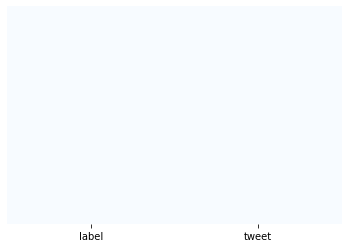

In [7]:
sns.heatmap(df.isnull(), cmap='Blues',cbar = False, yticklabels = False)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1E5579D0>]],
      dtype=object)

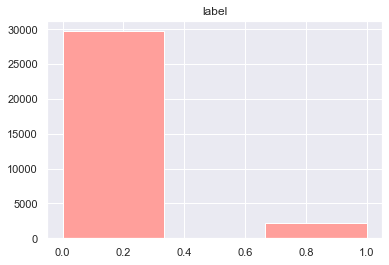

In [10]:
df.hist(bins = 3, color = 'p')

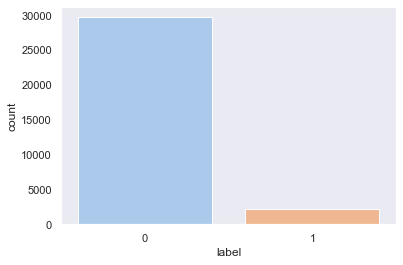

In [12]:
sns.set(palette='pastel', style = 'dark')
sns.countplot(x='label', data = df)

In [15]:
df['length'] = df['tweet'].apply(len)
df.head()

,label,tweet,length
0,0,@user when a father is dysfunctional and is s...,102
1,0,@user @user thanks for #lyft credit i can't us...,122
2,0,bihday your majesty,21
3,0,#model i love u take with u all the time in ...,86
4,0,factsguide: society now #motivation,39


In [16]:
df.describe()

,label,length
count,31962.000000,31962.000000
mean,0.070146,84.739628
std,0.255397,29.455749
min,0.000000,11.000000
25%,0.000000,63.000000
50%,0.000000,88.000000
75%,0.000000,108.000000
max,1.000000,274.000000


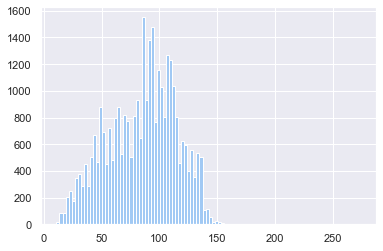

In [22]:
df['length'].hist(bins = 100)

In [23]:
positive = df[df['label'] == 0]
positive

,label,tweet,length
0,0,@user when a father is dysfunctional and is s...,102
1,0,@user @user thanks for #lyft credit i can't us...,122
2,0,bihday your majesty,21
3,0,#model i love u take with u all the time in ...,86
4,0,factsguide: society now #motivation,39
...,...,...,...
31956,0,off fishing tomorrow @user carnt wait first ti...,61
31957,0,ate @user isz that youuu?ðððððð...,68
31958,0,to see nina turner on the airwaves trying to...,131
31959,0,listening to sad songs on a monday morning otw...,63


In [25]:
negative = df[df['label'] == 1]
negative

,label,tweet,length
13,1,@user #cnn calls #michigan middle school 'buil...,74
14,1,no comment! in #australia #opkillingbay #se...,101
17,1,retweet if you agree!,22
23,1,@user @user lumpy says i am a . prove it lumpy.,47
34,1,it's unbelievable that in the 21st century we'...,104
...,...,...,...
31934,1,lady banned from kentucky mall. @user #jcpenn...,59
31946,1,@user omfg i'm offended! i'm a mailbox and i'...,82
31947,1,@user @user you don't have the balls to hashta...,112
31948,1,"makes you ask yourself, who am i? then am i a...",87


### Cleaning data
     - Remove punctuation
     - Remove stopword
     - Steming
     - Tokenizetion

In [34]:
import re
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tokenize import TweetTokenizer
import string

In [42]:
def message_clean(tweet):
    tweet = re.sub(r'\$\w*', '', tweet) #Remove  
    tweet = re.sub(r'^RT[\s]+','',tweet) #Remove
    tweet = re.sub(r'https?:\/\/.*[\r\n]*','',tweet) #Remove hyperlink
    tweet = re.sub(r'#','',tweet) #Remove hastag

    tokenizer = TweetTokenizer(preserve_case=False, reduce_len=True, strip_handles=True)
    tweet_token = tokenizer.tokenize(tweet)

    stemmer = PorterStemmer()
    stopwords_english = stopwords.words("english")
    tweet_clean = []
    for word in tweet_token:
        if (word not in stopwords_english and word not in string.punctuation):
            stem_word = stemmer.stem(word)
            tweet_clean.append(stem_word)
    tweet_cleaned = ' '.join(tweet_clean)
    return tweet_cleaned

In [52]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(analyzer=message_clean, dtype = 'uint8')
tweet_vectorizer = vectorizer.fit_transform(df['tweet'])


In [54]:
print(tweet_vectorizer.toarray())

[[ 6  0  0 ...  0  0  0]
 [11  1  0 ...  0  0  0]
 [ 1  0  0 ...  0  0  0]
 ...
 [ 7  0  0 ...  0  0  0]
 [ 6  0  0 ...  0  0  0]
 [ 1  0  0 ...  0  0  0]]


In [55]:
tweet_vectorizer.shape

(31962, 141)

In [57]:
X = pd.DataFrame(tweet_vectorizer.toarray())

In [67]:
X.shape

(31962, 141)

In [59]:
Y = df['label']

In [69]:
Y.shape

(31962,)

### Train Model (Navie Bayes)

In [72]:
from sklearn.model_selection import train_test_split
trainX, testX, trainY, testY = train_test_split(X,Y)

In [70]:
trainX.shape

(23971, 141)

In [73]:
# I use MultinomialNB in sklean libraries
from sklearn.naive_bayes import MultinomialNB

model = MultinomialNB()
model.fit(trainX, trainY)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

### Assess Trained Model Performance

In [91]:
from sklearn.metrics import classification_report, confusion_matrix, plot_confusion_matrix

In [112]:
y_pred = model.predict(testX)
cm = confusion_matrix(testY, y_pred)
print(cm)

[[5829 1629]
 [ 224  309]]


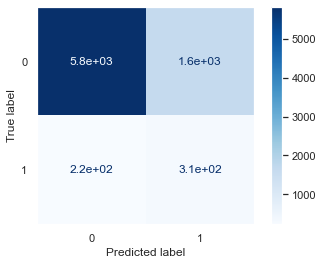

In [108]:
plot_confusion_matrix(model,testX, testY, cmap = 'Blues')

In [82]:
print(classification_report(testY, y_pred))

precision    recall  f1-score   support

           0       0.96      0.78      0.86      7458
           1       0.16      0.58      0.25       533

    accuracy                           0.77      7991
   macro avg       0.56      0.68      0.56      7991
weighted avg       0.91      0.77      0.82      7991

